# [E-03] 프로젝트: 고양이 수염 스티커 만들기


# 정면 얼굴에 고양이 수염 스티커 만들기
---

## Step 1. 스티커 구하기 or 만들기
* flaticon에 공개 되어있는 고양이 수염 이미지를 다운 받습니다.
    * [고양이 수염 이미지](https://www.flaticon.com/free-icon/cat-whiskers_24674?term=cat%20nose&page=1&position=1)
    * 셀카 사진도 다운로드 받아서 고양이 수염과 같은 폴더 안에 넣습니다. 

## Step 2. 얼굴 검출 & 랜드마크 검출 하기

* 이미지 처리를 위해서 opencv (cv2)를 import 합니다.
* 이미지 출력을 위해서 matplotlib를 import 합니다.
* 배열 처리를 위한 numpy를 import 합니다.
* 이미지 라이브러리 dlib를 import 합니다. 

In [1]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import dlib

* opencv는 matplotlib 또는 dlib와 다르게 BGR(파랑, 초록, 빨강) 이미지 채널을 사용합니다.
    * matplotlib와 dlib는 RGB(빨강, 초록, 파랑) 이미지 채널을 사용합니다. 

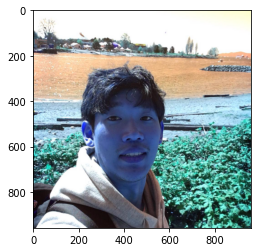

In [2]:
my_image_path = os.getenv('HOME')+'/aiffel/explore3_sticker/cat_whiskers/images/vancouver.png'
img_bgr = cv2.imread(my_image_path)    # OpenCV로 이미지를 불러옵니다
img_show = img_bgr.copy()      # 출력용 이미지를 따로 보관합니다
plt.imshow(img_bgr)
plt.show()

* BGR채널 이미지를 RGB채널 이미지로 바꿔줍니다.

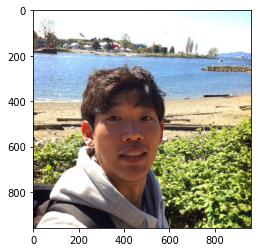

In [3]:
# plt.imshow 이전에 RGB 이미지로 바꾸는 것을 잊지마세요. 
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

### 얼굴 검출 face detection

In [4]:
# detector를 선언합니다
detector_hog = dlib.get_frontal_face_detector()

* detector_hog를 이용해서 사진 속 얼굴의 bounding box를 추출합니다.
    * detector_hog를 이용하면 upsampling을 통해 작게 촬영된 이미지를 더 크게 확인하고 얼굴을 인식 할 수 있습니다. 

In [5]:
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
dlib_rects = detector_hog(img_rgb, 1)   # (image, num of image pyramid)

rectangles[[(290, 439) (557, 706)]]


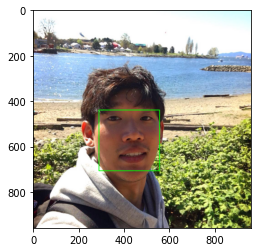

In [6]:
print(dlib_rects)   

for dlib_rect in dlib_rects:
    l = dlib_rect.left()
    t = dlib_rect.top()
    r = dlib_rect.right()
    b = dlib_rect.bottom()

    cv2.rectangle(img_show, (l,t), (r,b), (0,255,0), 2, lineType=cv2.LINE_AA)

img_show_rgb =  cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.imshow(img_show_rgb)
plt.show()

### 얼굴 랜드마크 face landmark
* face landmark localization 기술을 이용하여 bounding box로 crop한 얼굴 이미지에서 68개의 이목구비 위치를 찾아냅니다. 
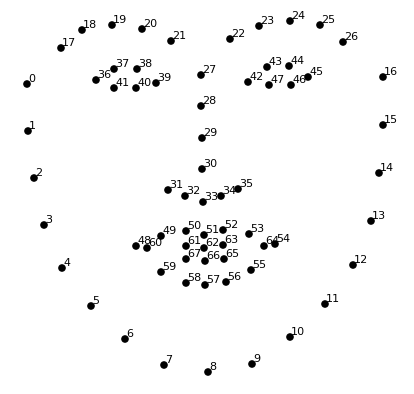

In [7]:
model_path = os.getenv('HOME')+'/aiffel/explore3_sticker/cat_whiskers/models/shape_predictor_68_face_landmarks.dat'
landmark_predictor = dlib.shape_predictor(model_path)

In [8]:
list_landmarks = []

# 얼굴 영역 박스 마다 face landmark를 찾아냅니다
for dlib_rect in dlib_rects:
    points = landmark_predictor(img_rgb, dlib_rect)
    # face landmark 좌표를 저장해둡니다
    list_points = list(map(lambda p: (p.x, p.y), points.parts()))
    list_landmarks.append(list_points)

print(len(list_landmarks[0]))

68


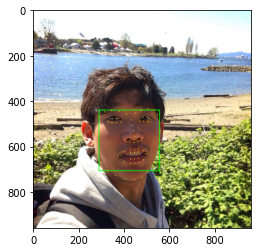

In [9]:
for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(img_show, point, 2, (0, 255, 255), -1)

img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.imshow(img_show_rgb)
plt.show()

### 3-5. 스티커 적용하기
* 고양이 수염 스티커를 코 부분에 적용합니다. 

1. 스티커 위치
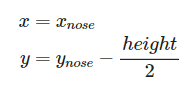

2. 스티커 크기
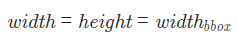

In [10]:
for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
    print (landmark[29]) # 코의 index는 29 입니다
    #x = landmark[29][0]
    x = l
    #y = landmark[57][1]
    y = t
    w = h = dlib_rect.width()
    print ('(x,y) : (%d,%d)'%(x,y))
    print ('(w,h) : (%d,%d)'%(w,h))

(442, 529)
(x,y) : (290,439)
(w,h) : (268,268)


In [11]:
sticker_path = os.getenv('HOME')+'/aiffel/explore3_sticker/cat_whiskers/images/cat-whiskers.png'
img_sticker = cv2.imread(sticker_path) # 스티커 이미지를 불러옵니다
img_sticker = cv2.resize(img_sticker, (w,h))
print (img_sticker.shape)

(268, 268, 3)


* 스티거의 크기를 resize 합니다. 

In [12]:
#refined_x = x - w // 2
#refined_y = y - h
refined_x = x + 20
refined_y = y + 3
#print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

In [13]:
if refined_x < 0: 
    img_sticker = img_sticker[:, -refined_x:]
    refined_x = 0
if refined_y < 0:
    img_sticker = img_sticker[-refined_y:, :]
    refined_y = 0

print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

(x,y) : (310,442)


* resize한 스티커를 사진에 맞게 재배치 합니다. 

In [14]:
# 길어서 복잡해 보이지만 img_show[from:to] 형식입니다
sticker_area = img_show[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
img_show[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==255, sticker_area,img_sticker).astype(np.uint8)
print("슝~")

슝~


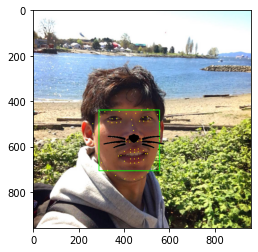

In [15]:
plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

* 원본 이미지에 스티커를 적용하여 결과를 출력합니다. 


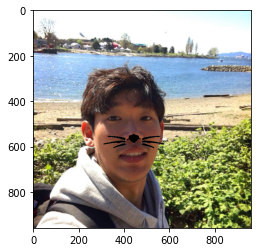

In [16]:
sticker_area = img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==255, sticker_area, img_sticker).astype(np.uint8)
plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
plt.show()

* 원본 이미지에 고양이 수염 스티커를 적용할 때, 고양이 수염의 배경이 흰색으로 나타나는 오류가 있었습니다. 
    * np.where(img_sticker==0, sticker_area, img_sticker)에 있는 숫자 0을 아래와 같이 255로 변경하니 문제는 해결됬습니다. 
    * np.where(img_sticker==0, sticker_area, img_sticker)
    * 이는 img_sticker의 검정색 부분은 sticker_area로 바꾸고 나머지는 img_sticker로 그대로 두라는 의미를 갖고 있습니다. 
    
#### 여러가지의 다양한 사진에 고양이 수염을 적용해보겠습니다. 
* 밝은/어두운 얼굴에 고양이 수염 스티커 적용
* 45도/90도 회전한 얼굴에 고양이 수염 스티커 적용
* 가까운/먼 얼굴에 고양이 수염 스티커 적용
* 마스크 쓴 얼굴에 고양이 수염 스티커 적용

# 밝은/어두운 얼굴에 고양이 수염 스티커 적용
---

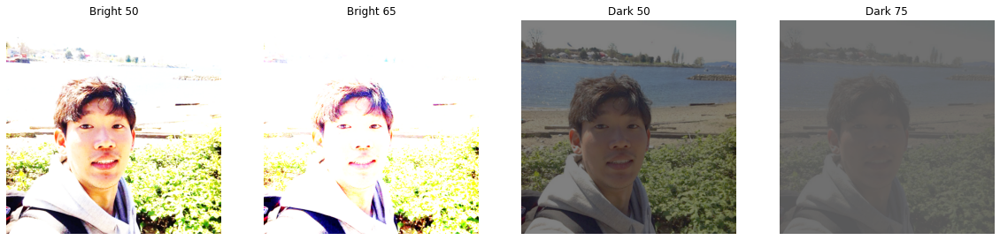

In [17]:
my_image_path1 = os.getenv('HOME')+'/aiffel/explore3_sticker/cat_whiskers/images/vancouver_bright50.png'
my_image_path2 = os.getenv('HOME')+'/aiffel/explore3_sticker/cat_whiskers/images/vancouver_bright65.png'
my_image_path3 = os.getenv('HOME')+'/aiffel/explore3_sticker/cat_whiskers/images/vancouver_dark50.png'
my_image_path4 = os.getenv('HOME')+'/aiffel/explore3_sticker/cat_whiskers/images/vancouver_dark75.png'

# OpenCV로 이미지를 불러옵니다
bright50_bgr = cv2.imread(my_image_path1)    
bright65_bgr = cv2.imread(my_image_path2)    
dark50_bgr = cv2.imread(my_image_path3)    
dark75_bgr = cv2.imread(my_image_path4) 

bright50_show = bright50_bgr.copy()
bright65_show = bright65_bgr.copy()    
dark50_show = dark50_bgr.copy()
dark75_show = dark75_bgr.copy()

# BGR2RGB
bright50_rgb = cv2.cvtColor(bright50_bgr, cv2.COLOR_BGR2RGB)    
bright65_rgb= cv2.cvtColor(bright65_bgr, cv2.COLOR_BGR2RGB)    
dark50_rgb = cv2.cvtColor(dark50_bgr, cv2.COLOR_BGR2RGB) 
dark75_rgb = cv2.cvtColor(dark75_bgr, cv2.COLOR_BGR2RGB) 
 
# 4장 이미지 한번에 보기
fig = plt.figure(figsize = (20,20))
rows = 1
cols = 4

ax1 = fig.add_subplot(rows, cols, 1)
ax1.imshow(bright50_rgb)
ax1.set_title('Bright 50')
ax1.axis("off")

ax2 = fig.add_subplot(rows, cols, 2)
ax2.imshow(bright65_rgb)
ax2.set_title('Bright 65')
ax2.axis("off")

ax3 = fig.add_subplot(rows, cols, 3)
ax3.imshow(dark50_rgb)
ax3.set_title('Dark 50')
ax3.axis("off")

ax4 = fig.add_subplot(rows, cols, 4)
ax4.imshow(dark75_rgb)
ax4.set_title('Dark 75')
ax4.axis("off")

plt.show()

In [18]:
bright50_dlib_rects = detector_hog(bright50_rgb, 1)   # (image, num of image pyramid)
bright65_dlib_rects = detector_hog(bright65_rgb, 1)   # (image, num of image pyramid)
dark50_dlib_rects = detector_hog(dark50_rgb, 1)   # (image, num of image pyramid)
dark75_dlib_rects = detector_hog(dark75_rgb, 1)   # (image, num of image pyramid)

In [19]:
print(bright50_dlib_rects)   
print(bright65_dlib_rects)   
print(dark50_dlib_rects)   
print(dark75_dlib_rects) 

rectangles[[(167, 236) (322, 391)]]
rectangles[]
rectangles[[(167, 236) (322, 391)]]
rectangles[]


* bright 65%와 dark 75%에서는 얼굴의 윤곽이 뚜렷하게 나타나지 않아서 그런지, bounding box 추출이 안됩니다.

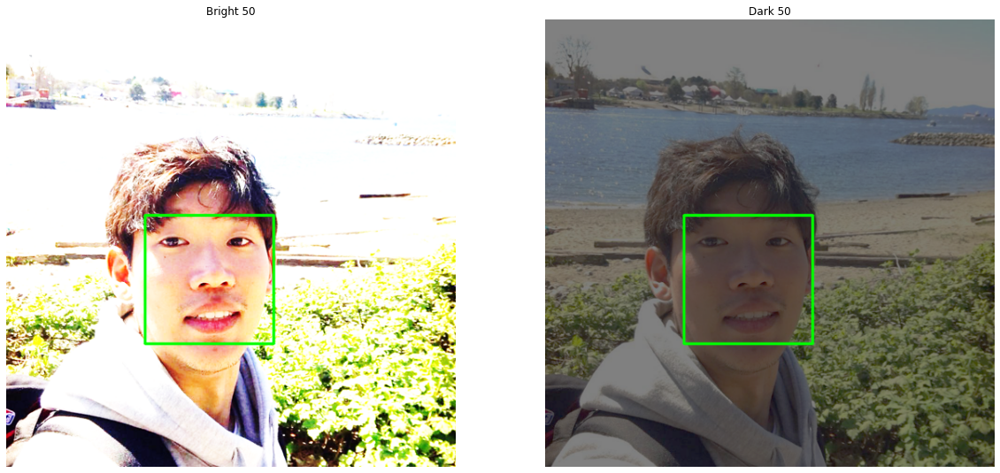

In [20]:
for bright50_dlib_rect in bright50_dlib_rects:
    l = bright50_dlib_rect.left()
    t = bright50_dlib_rect.top()
    r = bright50_dlib_rect.right()
    b = bright50_dlib_rect.bottom()
    
    cv2.rectangle(bright50_show, (l,t), (r,b), (0,255,0), 2, lineType=cv2.LINE_AA)
    
for dark50_dlib_rect in dark50_dlib_rects:
    l = dark50_dlib_rect.left()
    t = dark50_dlib_rect.top()
    r = dark50_dlib_rect.right()
    b = dark50_dlib_rect.bottom()
    
    cv2.rectangle(dark50_show, (l,t), (r,b), (0,255,0), 2, lineType=cv2.LINE_AA)

bright50_show_rgb =  cv2.cvtColor(bright50_show, cv2.COLOR_BGR2RGB)    
dark50_show_rgb =  cv2.cvtColor(dark50_show, cv2.COLOR_BGR2RGB)

# 2장 이미지 한번에 보기
fig = plt.figure(figsize = (20,20))
rows = 1
cols = 2

ax1 = fig.add_subplot(rows, cols, 1)
ax1.imshow(bright50_show_rgb)
ax1.set_title('Bright 50')
ax1.axis("off")

ax2 = fig.add_subplot(rows, cols, 2)
ax2.imshow(dark50_show_rgb)
ax2.set_title('Dark 50')
ax2.axis("off")

plt.show()

In [21]:
model_path = os.getenv('HOME')+'/aiffel/explore3_sticker/cat_whiskers/models/shape_predictor_68_face_landmarks.dat'
landmark_predictor = dlib.shape_predictor(model_path)

In [22]:
list_landmarks = []
list_landmarks1 = []

# 얼굴 영역 박스 마다 face landmark를 찾아냅니다
for bright50_dlib_rect in bright50_dlib_rects:
    points = landmark_predictor(bright50_rgb, bright50_dlib_rect)
    # face landmark 좌표를 저장해둡니다
    list_points = list(map(lambda p: (p.x, p.y), points.parts()))
    list_landmarks.append(list_points)

# 얼굴 영역 박스 마다 face landmark를 찾아냅니다
for dark50_dlib_rect in dark50_dlib_rects:
    points = landmark_predictor(dark50_rgb, dark50_dlib_rect)
    # face landmark 좌표를 저장해둡니다
    list_points = list(map(lambda p: (p.x, p.y), points.parts()))
    list_landmarks1.append(list_points)

print(len(list_landmarks[0]))
print(len(list_landmarks1[0]))

68
68


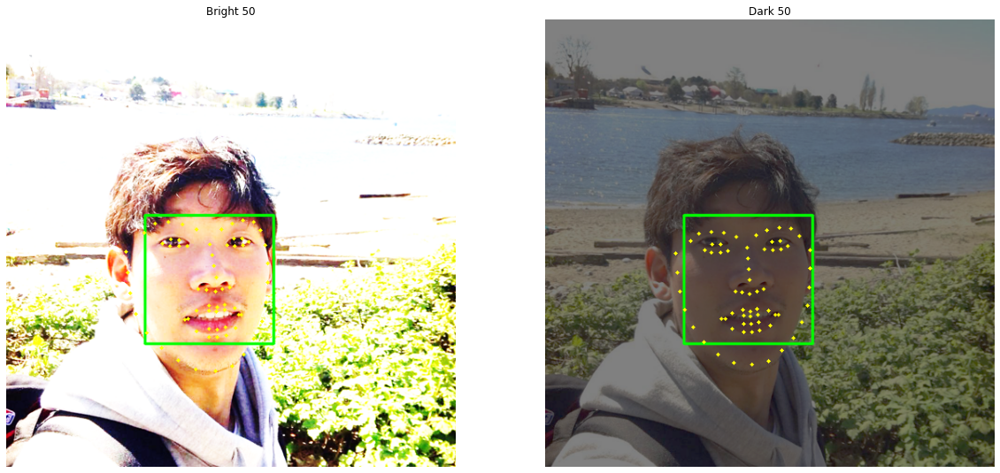

In [23]:
for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(bright50_show, point, 2, (0, 255, 255), -1)

for landmark in list_landmarks1:
    for point in landmark:
        cv2.circle(dark50_show, point, 2, (0, 255, 255), -1)

bright50_show_rgb = cv2.cvtColor(bright50_show, cv2.COLOR_BGR2RGB)
dark50_show_rgb = cv2.cvtColor(dark50_show, cv2.COLOR_BGR2RGB)

# 2장 이미지 한번에 보기
fig = plt.figure(figsize = (20,20))
rows = 1
cols = 2

ax1 = fig.add_subplot(rows, cols, 1)
ax1.imshow(bright50_show_rgb)
ax1.set_title('Bright 50')
ax1.axis("off")

ax2 = fig.add_subplot(rows, cols, 2)
ax2.imshow(dark50_show_rgb)
ax2.set_title('Dark 50')
ax2.axis("off")

plt.show()

In [24]:
for bright50_dlib_rect, landmark in zip(bright50_dlib_rects, list_landmarks):
    print (landmark[29]) # 코의 index는 29 입니다
    #x = landmark[29][0]
    x = l
    #y = landmark[57][1]
    y = t
    w = h = bright50_dlib_rect.width()
    print ('(x,y) : (%d,%d)'%(x,y))
    print ('(w,h) : (%d,%d)'%(w,h))

for dark50_dlib_rect, landmark in zip(dark50_dlib_rects, list_landmarks1):
    print (landmark[29]) # 코의 index는 29 입니다
    #x = landmark[29][0]
    x = l
    #y = landmark[57][1]
    y = t
    w = h = dark50_dlib_rect.width()
    print ('(x,y) : (%d,%d)'%(x,y))
    print ('(w,h) : (%d,%d)'%(w,h))

(250, 297)
(x,y) : (167,236)
(w,h) : (156,156)
(245, 301)
(x,y) : (167,236)
(w,h) : (156,156)


In [25]:
sticker_path = os.getenv('HOME')+'/aiffel/explore3_sticker/cat_whiskers/images/cat-whiskers.png'
img_sticker = cv2.imread(sticker_path) # 스티커 이미지를 불러옵니다
img_sticker = cv2.resize(img_sticker, (w,h))
print (img_sticker.shape)

(156, 156, 3)


In [26]:
#refined_x = x - w // 2
#refined_y = y - h
refined_x = x + 10
refined_y = y + 3
#print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

In [27]:
if refined_x < 0: 
    img_sticker = img_sticker[:, -refined_x:]
    refined_x = 0
if refined_y < 0:
    img_sticker = img_sticker[-refined_y:, :]
    refined_y = 0

print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

(x,y) : (177,239)


In [28]:
# 길어서 복잡해 보이지만 img_show[from:to] 형식입니다
sticker_area = bright50_show[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]

bright50_show[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==0,img_sticker,sticker_area).astype(np.uint8)

sticker_area = dark50_show[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]

dark50_show[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==0,img_sticker,sticker_area).astype(np.uint8)


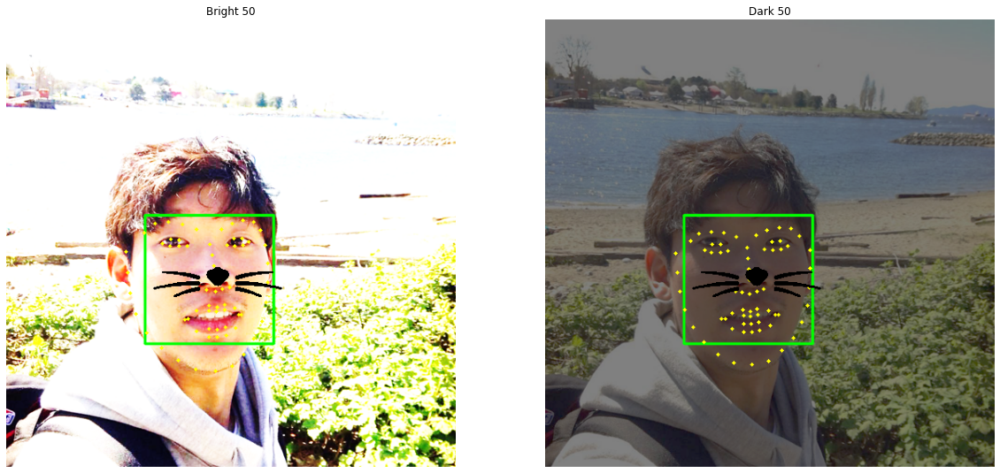

In [29]:
bright50_rgb = cv2.cvtColor(bright50_show, cv2.COLOR_BGR2RGB)
dark50_rgb = cv2.cvtColor(dark50_show, cv2.COLOR_BGR2RGB)

# 2장 이미지 한번에 보기
fig = plt.figure(figsize = (20,20))
rows = 1
cols = 2

ax1 = fig.add_subplot(rows, cols, 1)
ax1.imshow(bright50_rgb)
ax1.set_title('Bright 50')
ax1.axis("off")

ax2 = fig.add_subplot(rows, cols, 2)
ax2.imshow(dark50_rgb)
ax2.set_title('Dark 50')
ax2.axis("off")

plt.show()

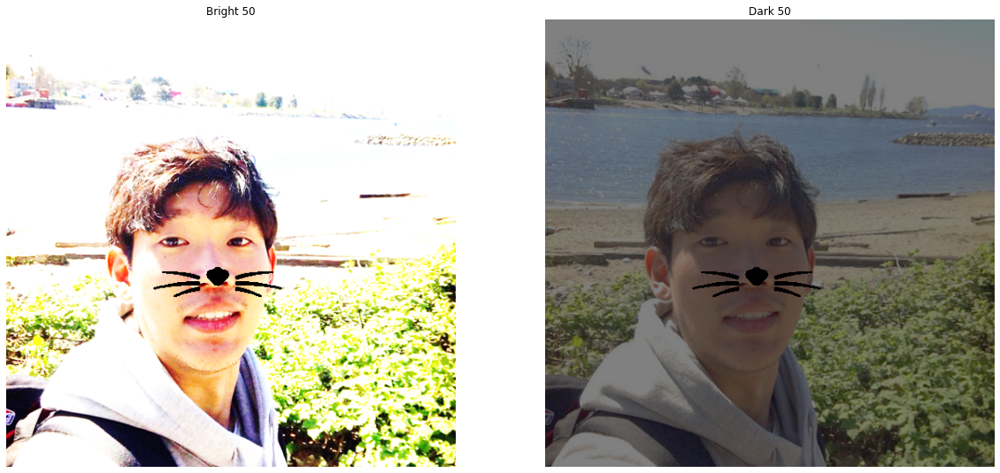

In [30]:
sticker_area = bright50_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
bright50_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==0,img_sticker,sticker_area).astype(np.uint8)

sticker_area = dark50_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
dark50_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==0,img_sticker,sticker_area).astype(np.uint8)

bright50_rgb = cv2.cvtColor(bright50_bgr, cv2.COLOR_BGR2RGB)
dark50_rgb = cv2.cvtColor(dark50_bgr, cv2.COLOR_BGR2RGB)

# 2장 이미지 한번에 보기
fig = plt.figure(figsize = (20,20))
rows = 1
cols = 2

ax1 = fig.add_subplot(rows, cols, 1)
ax1.imshow(bright50_rgb)
ax1.set_title('Bright 50')
ax1.axis("off")

ax2 = fig.add_subplot(rows, cols, 2)
ax2.imshow(dark50_rgb)
ax2.set_title('Dark 50')
ax2.axis("off")

plt.show()

* 처음에는 밝기를 50% 그리고 65% 적용한 사진 2장과 어두운 필터를 50% 그리고 75% 적용한 사진 2장을 사용하여 고양이 수염 스티커 적용을 시작했습니다. 
    * 하지만, bright 65%와 dark 75%에서는 얼굴의 윤곽이 뚜렷하게 나타나지 않아서 그런지, bounding box 추출이 안됬습니다.
* 밝기 50%와 어두운 필터 50%를 적용한 사진에는 고양이 수염이 알맞게 적용된 것을 확인할 수 있습니다. 

# 20도/45도 회전한 얼굴에 고양이 수염 스티커 적용
---

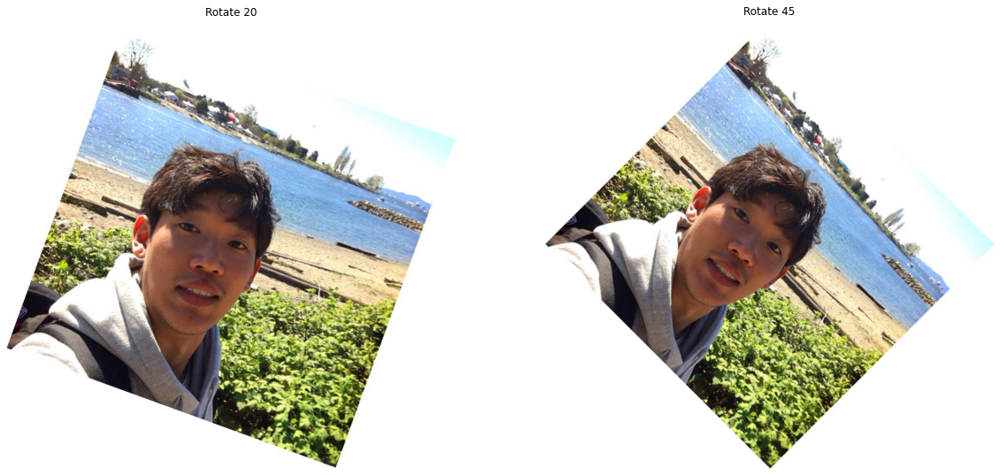

In [31]:
my_image_path1 = os.getenv('HOME')+'/aiffel/explore3_sticker/cat_whiskers/images/vancouver_rotate20.png'
my_image_path2 = os.getenv('HOME')+'/aiffel/explore3_sticker/cat_whiskers/images/vancouver_rotate45.png'

# OpenCV로 이미지를 불러옵니다
rotate20_bgr = cv2.imread(my_image_path1)    
rotate45_bgr = cv2.imread(my_image_path2)    

rotate20_show = rotate20_bgr.copy()
rotate45_show = rotate45_bgr.copy()    

# BGR2RGB
rotate20_rgb = cv2.cvtColor(rotate20_bgr, cv2.COLOR_BGR2RGB)    
rotate45_rgb = cv2.cvtColor(rotate45_bgr, cv2.COLOR_BGR2RGB)    
 
# 4장 이미지 한번에 보기
fig = plt.figure(figsize = (20,20))
rows = 1
cols = 2

ax1 = fig.add_subplot(rows, cols, 1)
ax1.imshow(rotate20_rgb)
ax1.set_title('Rotate 20')
ax1.axis("off")

ax2 = fig.add_subplot(rows, cols, 2)
ax2.imshow(rotate45_rgb)
ax2.set_title('Rotate 45')
ax2.axis("off")

plt.show()

In [32]:
rotate20_dlib_rects = detector_hog(rotate20_rgb, 1)   # (image, num of image pyramid)
rotate45_dlib_rects = detector_hog(rotate45_rgb, 1)   # (image, num of image pyramid)

print(rotate20_dlib_rects)
print(rotate45_dlib_rects)   

rectangles[[(290, 350) (557, 617)]]
rectangles[]


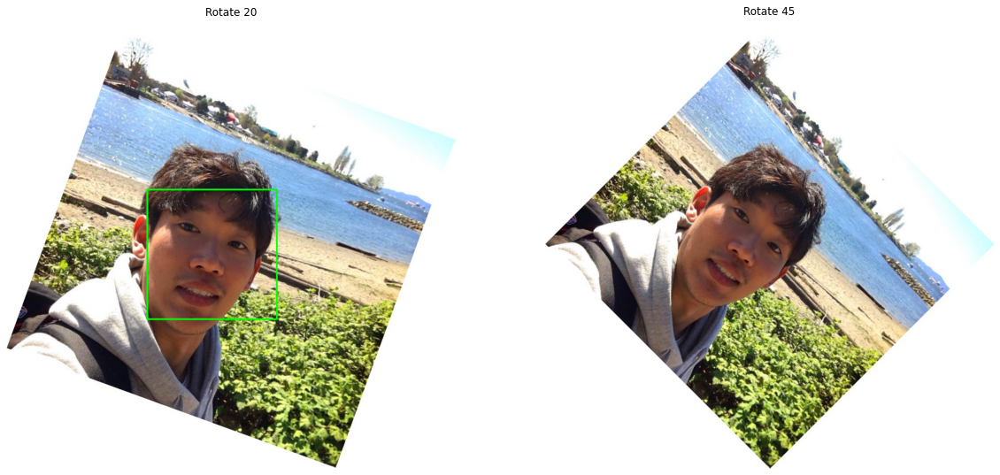

In [33]:
for rotate20_dlib_rect in rotate20_dlib_rects:
    l = rotate20_dlib_rect.left()
    t = rotate20_dlib_rect.top()
    r = rotate20_dlib_rect.right()
    b = rotate20_dlib_rect.bottom()
    
    cv2.rectangle(rotate20_show, (l,t), (r,b), (0,255,0), 2, lineType=cv2.LINE_AA)
    
for rotate45_dlib_rect in rotate45_dlib_rects:
    l = rotate45_dlib_rect.left()
    t = rotate45_dlib_rect.top()
    r = rotate45_dlib_rect.right()
    b = rotate45_dlib_rect.bottom()
    
    cv2.rectangle(rotate45_show, (l,t), (r,b), (0,255,0), 2, lineType=cv2.LINE_AA)

rotate20_show_rgb =  cv2.cvtColor(rotate20_show, cv2.COLOR_BGR2RGB)    
rotate45_show_rgb =  cv2.cvtColor(rotate45_show, cv2.COLOR_BGR2RGB)

# 2장 이미지 한번에 보기
fig = plt.figure(figsize = (20,20))
rows = 1
cols = 2

ax1 = fig.add_subplot(rows, cols, 1)
ax1.imshow(rotate20_show_rgb)
ax1.set_title('Rotate 20')
ax1.axis("off")

ax2 = fig.add_subplot(rows, cols, 2)
ax2.imshow(rotate45_show_rgb)
ax2.set_title('Rotate 45')
ax2.axis("off")

plt.show()

* 위의 사진과 같이 20도 회전한 사진에서는 bounding box로 얼굴을 찾아냈지만, 45도 회전한 사진에서는 얼굴을 찾아내지 못했습니다. 

In [34]:
model_path = os.getenv('HOME')+'/aiffel/explore3_sticker/cat_whiskers/models/shape_predictor_68_face_landmarks.dat'
landmark_predictor = dlib.shape_predictor(model_path)

In [35]:
list_landmarks = []

# 얼굴 영역 박스 마다 face landmark를 찾아냅니다
for rotate20_dlib_rect in rotate20_dlib_rects:
    points = landmark_predictor(rotate20_rgb, rotate20_dlib_rect)
    # face landmark 좌표를 저장해둡니다
    list_points = list(map(lambda p: (p.x, p.y), points.parts()))
    list_landmarks.append(list_points)

print(len(list_landmarks[0]))

68


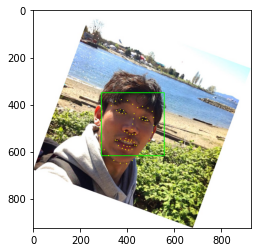

In [36]:
for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(rotate20_show, point, 2, (0, 255, 255), -1)

rotate20_show_rgb = cv2.cvtColor(rotate20_show, cv2.COLOR_BGR2RGB)
plt.imshow(rotate20_show_rgb)
plt.show()

In [37]:
for rotate20_dlib_rect, landmark in zip(rotate20_dlib_rects, list_landmarks):
    print (landmark[29]) # 코의 index는 29 입니다
    #x = landmark[30][0]
    x = l 
    #y = landmark[30][1] - dlib_rect.height()//2
    y = t - 200
    w = h = rotate20_dlib_rect.width()
    print ('(x,y) : (%d,%d)'%(x,y))
    print ('(w,h) : (%d,%d)'%(w,h))

(423, 483)
(x,y) : (290,150)
(w,h) : (268,268)


* 사진이 20도의 각도로 회전된 사실을 알기 때문에, 고양이 수염도 동일하게 20도 회전 시켜줍니다. 
    * [opencv-tutorial](https://opencv-python.readthedocs.io/en/latest/doc/10.imageTransformation/imageTransformation.html)에서 참고하여 고양이 수염을 회전 시켰습니다. 

(268, 268, 3)


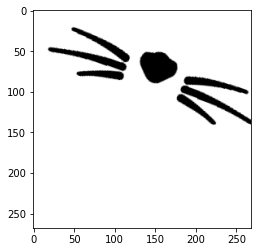

In [38]:
sticker_path = os.getenv('HOME')+'/aiffel/explore3_sticker/cat_whiskers/images/cat-whiskers.png'
img_sticker = cv2.imread(sticker_path) # 스티커 이미지를 불러옵니다
img_sticker = cv2.resize(img_sticker, (w,h))
print (img_sticker.shape)

tilt = cv2.getRotationMatrix2D((x,y), -20, 1)
tilt_sticker = cv2.warpAffine(img_sticker, tilt, (w, h), borderValue=(255,255,255))
tilt_sticker = cv2.resize (tilt_sticker, (w, h))

plt.imshow(tilt_sticker)
plt.show()

In [39]:
#refined_x = x - w // 2
#refined_y = y - h
refined_x = x - 25
refined_y = y + 270
print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

(x,y) : (265,420)


In [40]:
if refined_x < 0: 
    img_sticker = img_sticker[:, -refined_x:]
    refined_x = 0
if refined_y < 0:
    img_sticker = img_sticker[-refined_y:, :]
    refined_y = 0

print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

(x,y) : (265,420)


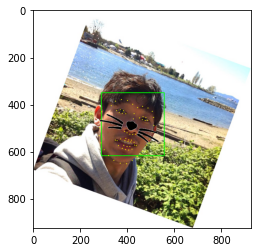

In [41]:
# 길어서 복잡해 보이지만 img_show[from:to] 형식입니다
sticker_area = rotate20_show[refined_y:refined_y+tilt_sticker.shape[0], refined_x:refined_x+tilt_sticker.shape[1]]
rotate20_show[refined_y:refined_y+tilt_sticker.shape[0], refined_x:refined_x+tilt_sticker.shape[1]] = \
    np.where(tilt_sticker==255, sticker_area,tilt_sticker).astype(np.uint8)

plt.imshow(cv2.cvtColor(rotate20_show, cv2.COLOR_BGR2RGB))
plt.show()

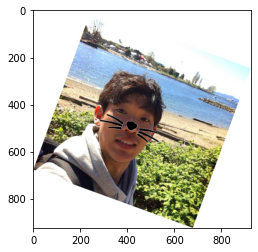

In [42]:
sticker_area = rotate20_bgr[refined_y:refined_y +tilt_sticker.shape[0], refined_x:refined_x+tilt_sticker.shape[1]]
rotate20_bgr[refined_y:refined_y +tilt_sticker.shape[0], refined_x:refined_x+tilt_sticker.shape[1]] = \
    np.where(tilt_sticker==255, sticker_area, tilt_sticker).astype(np.uint8)
plt.imshow(cv2.cvtColor(rotate20_bgr, cv2.COLOR_BGR2RGB))
plt.show()

* 처음에는 20도/45도 회전한 사진 2장을 갖고 시작하였지만, 45도 사진에서는 bounding box가 얼굴을 인식하지 못했습니다. 
    * 얼굴이 회전한 각도가 너무 크면 얼굴을 인식 할 수 없었습니다. 
* 20도 회전한 얼굴에는 고양이 수염이 잘 적용된 것을 확인할 수 있습니다. 

# 가까운/먼 얼굴에 고양이 수염 스티커 적용
---

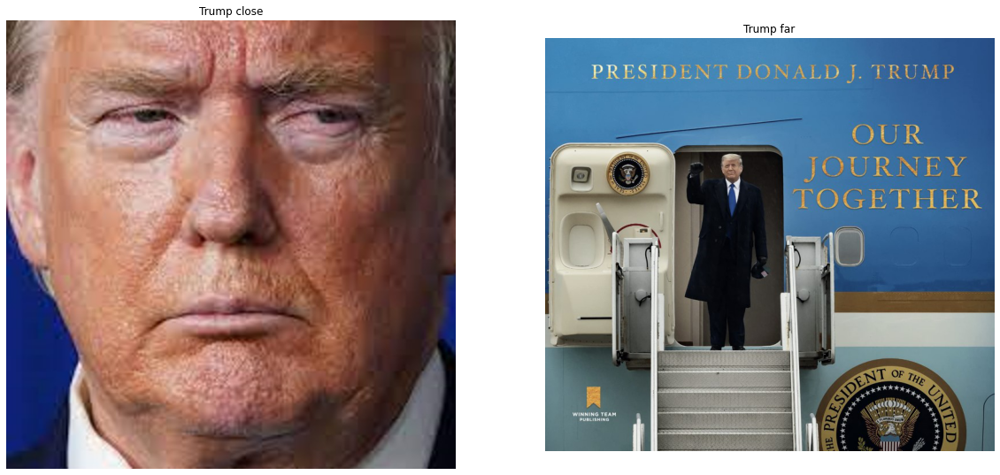

In [43]:
my_image_path1 = os.getenv('HOME')+'/aiffel/explore3_sticker/cat_whiskers/images/trump_close.png'
my_image_path2 = os.getenv('HOME')+'/aiffel/explore3_sticker/cat_whiskers/images/trump_far.png'

# OpenCV로 이미지를 불러옵니다
trumpclose_bgr = cv2.imread(my_image_path1)    
trumpfar_bgr = cv2.imread(my_image_path2)    

trumpclose_show = trumpclose_bgr.copy()
trumpfar_show = trumpfar_bgr.copy()    

# BGR2RGB
trumpclose_rgb = cv2.cvtColor(trumpclose_bgr, cv2.COLOR_BGR2RGB)    
trumpfar_rgb = cv2.cvtColor(trumpfar_bgr, cv2.COLOR_BGR2RGB)    
 
# 4장 이미지 한번에 보기
fig = plt.figure(figsize = (20,20))
rows = 1
cols = 2

ax1 = fig.add_subplot(rows, cols, 1)
ax1.imshow(trumpclose_rgb)
ax1.set_title('Trump close')
ax1.axis("off")

ax2 = fig.add_subplot(rows, cols, 2)
ax2.imshow(trumpfar_rgb)
ax2.set_title('Trump far')
ax2.axis("off")

plt.show()

In [44]:
trumpclose_dlib_rects = detector_hog(trumpclose_rgb, 1)   # (image, num of image pyramid)
trumpfar_dlib_rects = detector_hog(trumpfar_rgb, 1)   # (image, num of image pyramid)

print(trumpclose_dlib_rects)
print(trumpfar_dlib_rects)   

rectangles[[(58, -89) (724, 650)]]
rectangles[[(305, 214) (341, 250)]]


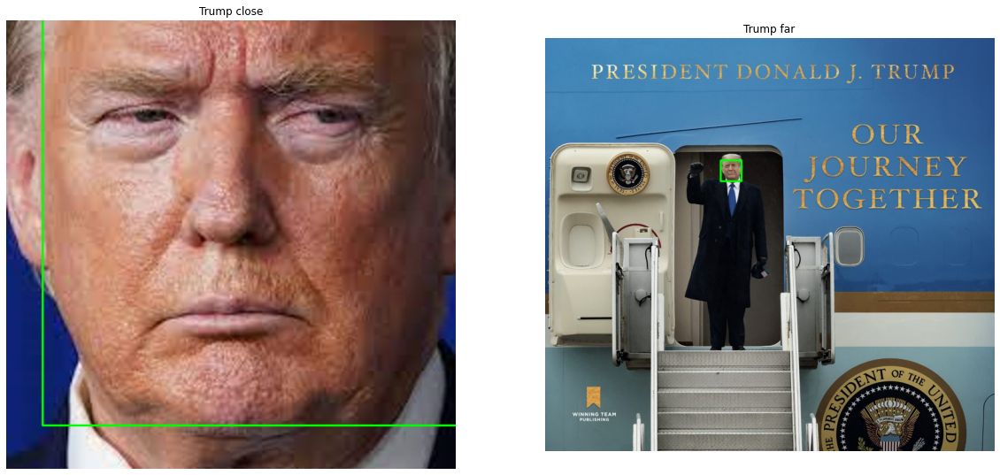

In [45]:
for trumpclose_dlib_rect in trumpclose_dlib_rects:
    l = trumpclose_dlib_rect.left()
    t = trumpclose_dlib_rect.top()
    r = trumpclose_dlib_rect.right()
    b = trumpclose_dlib_rect.bottom()
    
    cv2.rectangle(trumpclose_show, (l,t), (r,b), (0,255,0), 2, lineType=cv2.LINE_AA)
    
for trumpfar_dlib_rect in trumpfar_dlib_rects:
    l = trumpfar_dlib_rect.left()
    t = trumpfar_dlib_rect.top()
    r = trumpfar_dlib_rect.right()
    b = trumpfar_dlib_rect.bottom()
    
    cv2.rectangle(trumpfar_show, (l,t), (r,b), (0,255,0), 2, lineType=cv2.LINE_AA)

trumpclose_show_rgb =  cv2.cvtColor(trumpclose_show, cv2.COLOR_BGR2RGB)    
trumpfar_show_rgb =  cv2.cvtColor(trumpfar_show, cv2.COLOR_BGR2RGB)

# 2장 이미지 한번에 보기
fig = plt.figure(figsize = (20,20))
rows = 1
cols = 2

ax1 = fig.add_subplot(rows, cols, 1)
ax1.imshow(trumpclose_show_rgb)
ax1.set_title('Trump close')
ax1.axis("off")

ax2 = fig.add_subplot(rows, cols, 2)
ax2.imshow(trumpfar_show_rgb)
ax2.set_title('Trump far')
ax2.axis("off")

plt.show()

In [46]:
model_path = os.getenv('HOME')+'/aiffel/explore3_sticker/cat_whiskers/models/shape_predictor_68_face_landmarks.dat'
landmark_predictor = dlib.shape_predictor(model_path)

In [47]:
list_landmarks = []
list_landmarks1 = []

# 얼굴 영역 박스 마다 face landmark를 찾아냅니다
for trumpclose_dlib_rect in trumpclose_dlib_rects:
    points = landmark_predictor(trumpclose_rgb, trumpclose_dlib_rect)
    # face landmark 좌표를 저장해둡니다
    list_points = list(map(lambda p: (p.x, p.y), points.parts()))
    list_landmarks.append(list_points)

# 얼굴 영역 박스 마다 face landmark를 찾아냅니다
for trumpfar_dlib_rect in trumpfar_dlib_rects:
    points = landmark_predictor(trumpfar_rgb, trumpfar_dlib_rect)
    # face landmark 좌표를 저장해둡니다
    list_points = list(map(lambda p: (p.x, p.y), points.parts()))
    list_landmarks1.append(list_points)

print(len(list_landmarks[0]))
print(len(list_landmarks1[0]))

68
68


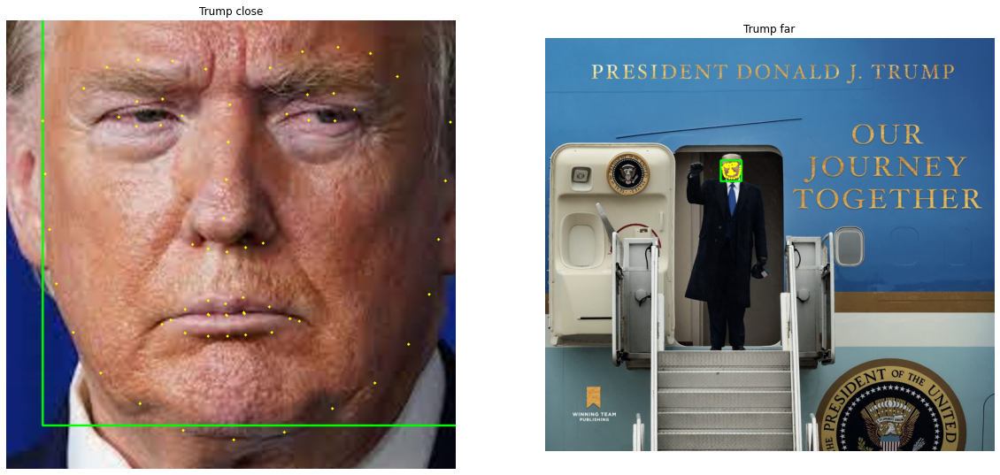

In [48]:
for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(trumpclose_show, point, 2, (0, 255, 255), -1)

for landmark in list_landmarks1:
    for point in landmark:
        cv2.circle(trumpfar_show, point, 2, (0, 255, 255), -1)

trumpclose_show_rgb = cv2.cvtColor(trumpclose_show, cv2.COLOR_BGR2RGB)
trumpfar_show_rgb = cv2.cvtColor(trumpfar_show, cv2.COLOR_BGR2RGB)

# 2장 이미지 한번에 보기
fig = plt.figure(figsize = (20,20))
rows = 1
cols = 2

ax1 = fig.add_subplot(rows, cols, 1)
ax1.imshow(trumpclose_show_rgb)
ax1.set_title('Trump close')
ax1.axis("off")

ax2 = fig.add_subplot(rows, cols, 2)
ax2.imshow(trumpfar_show_rgb)
ax2.set_title('Trump far')
ax2.axis("off")

plt.show()

In [49]:
for trumpclose_dlib_rect, landmark in zip(trumpclose_dlib_rects, list_landmarks):
    print (landmark[29]) # 코의 index는 29 입니다
    xc = landmark[30][0]
    #x = l
    yc = landmark[30][1]
    #y = t
    wc = hc = trumpclose_dlib_rect.width()
    print ('(x,y) : (%d,%d)'%(xc,yc))
    print ('(w,h) : (%d,%d)'%(wc,hc))

for trumpfar_dlib_rect, landmark in zip(trumpfar_dlib_rects, list_landmarks1):
    print (landmark[29]) # 코의 index는 29 입니다
    xf = landmark[30][0]
    #x = l
    yf = landmark[30][1]
    #y = t
    wf = hf = trumpfar_dlib_rect.width()
    print ('(x,y) : (%d,%d)'%(xf,yf))
    print ('(w,h) : (%d,%d)'%(wf,hf))

(352, 256)
(x,y) : (348,318)
(w,h) : (667,667)
(322, 227)
(x,y) : (322,230)
(w,h) : (37,37)


In [50]:
sticker_path = os.getenv('HOME')+'/aiffel/explore3_sticker/cat_whiskers/images/cat-whiskers.png'
img_sticker = cv2.imread(sticker_path) # 스티커 이미지를 불러옵니다

close_img_sticker = cv2.resize(img_sticker, (wc,hc))
far_img_sticker = cv2.resize(img_sticker, (wf,hf))

print (close_img_sticker.shape)
print (far_img_sticker.shape)

(667, 667, 3)
(37, 37, 3)


In [51]:
refined_xc = xc - wc // 2
refined_yc = yc - wc // 2

refined_xf = xf - wf // 2
refined_yf = yf - wf // 2
#refined_x = x + 10
#refined_y = y + 3
#print ('(x,y) : (%d,%d)'%(refined_x, refined_y))

In [52]:
if refined_xc < 0: 
    close_img_sticker = close_img_sticker[:, -refined_xc:]
    refined_xc = 0
if refined_yc < 0:
    close_img_sticker = close_img_sticker[-refined_yc:, :]
    refined_yc = 0
    
if refined_xf < 0: 
    far_img_sticker = far_img_sticker[:, -refined_xf:]
    refined_xf = 0
if refined_yf < 0:
    far_img_sticker = far_img_sticker[-refined_yf:, :]
    refined_yf = 0

print ('(x,y) : (%d,%d)'%(refined_xc, refined_yc))
print ('(x,y) : (%d,%d)'%(refined_xf, refined_yf))

(x,y) : (15,0)
(x,y) : (304,212)


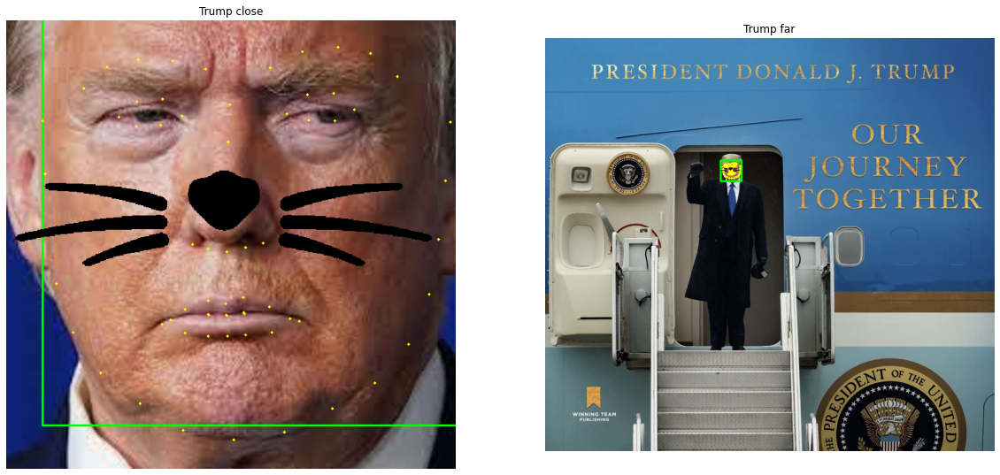

In [53]:
# 길어서 복잡해 보이지만 img_show[from:to] 형식입니다
sticker_area = trumpclose_show[refined_yc:refined_yc+close_img_sticker.shape[0], refined_xc:refined_xc+close_img_sticker.shape[1]]

trumpclose_show[refined_yc:refined_yc+close_img_sticker.shape[0], refined_xc:refined_xc+close_img_sticker.shape[1]] = \
    np.where(close_img_sticker==0,close_img_sticker,sticker_area).astype(np.uint8)

sticker_area = trumpfar_show[refined_yf:refined_yf+far_img_sticker.shape[0], refined_xf:refined_xf+far_img_sticker.shape[1]]

trumpfar_show[refined_yf:refined_yf+far_img_sticker.shape[0], refined_xf:refined_xf+far_img_sticker.shape[1]] = \
    np.where(far_img_sticker==0,far_img_sticker,sticker_area).astype(np.uint8)


trumpclose_rgb = cv2.cvtColor(trumpclose_show, cv2.COLOR_BGR2RGB)
trumpfar_rgb = cv2.cvtColor(trumpfar_show, cv2.COLOR_BGR2RGB)

# 2장 이미지 한번에 보기
fig = plt.figure(figsize = (20,20))
rows = 1
cols = 2

ax1 = fig.add_subplot(rows, cols, 1)
ax1.imshow(trumpclose_rgb)
ax1.set_title('Trump close')
ax1.axis("off")

ax2 = fig.add_subplot(rows, cols, 2)
ax2.imshow(trumpfar_rgb)
ax2.set_title('Trump far')
ax2.axis("off")

plt.show()

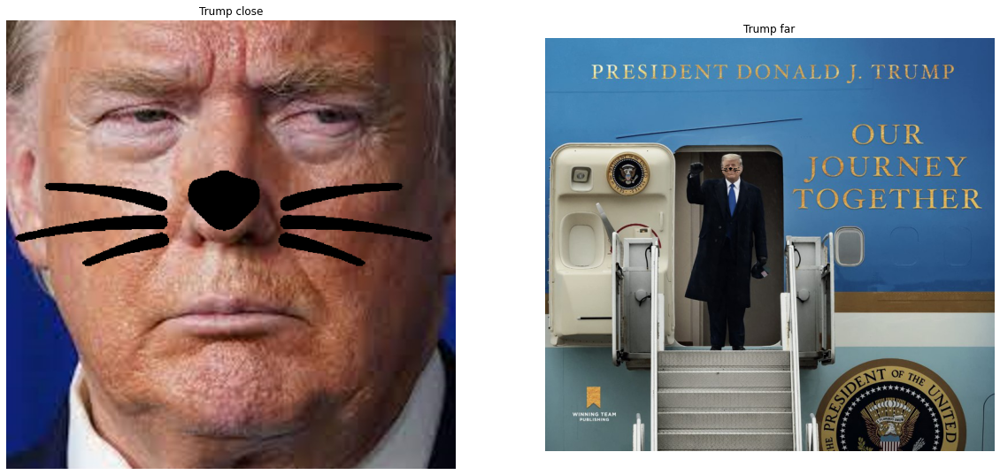

In [54]:
# 길어서 복잡해 보이지만 img_show[from:to] 형식입니다
sticker_area = trumpclose_bgr[refined_yc:refined_yc+close_img_sticker.shape[0], refined_xc:refined_xc+close_img_sticker.shape[1]]

trumpclose_bgr[refined_yc:refined_yc+close_img_sticker.shape[0], refined_xc:refined_xc+close_img_sticker.shape[1]] = \
    np.where(close_img_sticker==0,close_img_sticker,sticker_area).astype(np.uint8)

sticker_area = trumpfar_bgr[refined_yf:refined_yf+far_img_sticker.shape[0], refined_xf:refined_xf+far_img_sticker.shape[1]]

trumpfar_bgr[refined_yf:refined_yf+far_img_sticker.shape[0], refined_xf:refined_xf+far_img_sticker.shape[1]] = \
    np.where(far_img_sticker==0,far_img_sticker,sticker_area).astype(np.uint8)


trumpclose_rgb = cv2.cvtColor(trumpclose_bgr, cv2.COLOR_BGR2RGB)
trumpfar_rgb = cv2.cvtColor(trumpfar_bgr, cv2.COLOR_BGR2RGB)

# 2장 이미지 한번에 보기
fig = plt.figure(figsize = (20,20))
rows = 1
cols = 2

ax1 = fig.add_subplot(rows, cols, 1)
ax1.imshow(trumpclose_rgb)
ax1.set_title('Trump close')
ax1.axis("off")

ax2 = fig.add_subplot(rows, cols, 2)
ax2.imshow(trumpfar_rgb)
ax2.set_title('Trump far')
ax2.axis("off")

plt.show()

* 사진에서 인식한 얼굴 크기에 따라서 고양이 수염 사이즈도 변경하여서, 알맞게 잘 적용된 결과를 볼 수 있습니다. 

# 마스크 쓴 얼굴에 고양이 수염 스티커 적용
---

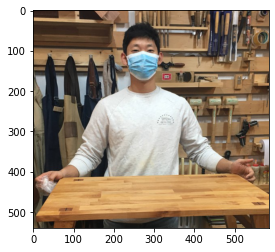

In [55]:
my_image_path = os.getenv('HOME')+'/aiffel/explore3_sticker/cat_whiskers/images/mask_face.png'
img_bgr = cv2.imread(my_image_path)    # OpenCV로 이미지를 불러옵니다
img_show = img_bgr.copy()      # 출력용 이미지를 따로 보관합니다

img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

In [56]:
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
dlib_rects = detector_hog(img_rgb, 1)   # (image, num of image pyramid)

rectangles[]


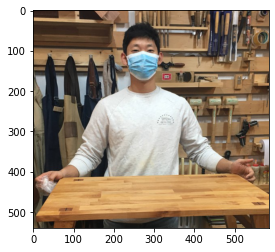

In [57]:
print(dlib_rects)   

for dlib_rect in dlib_rects:
    l = dlib_rect.left()
    t = dlib_rect.top()
    r = dlib_rect.right()
    b = dlib_rect.bottom()

    cv2.rectangle(img_show, (l,t), (r,b), (0,255,0), 2, lineType=cv2.LINE_AA)

img_show_rgb =  cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.imshow(img_show_rgb)
plt.show()

* 마스크를 쓰고 있는 얼굴을 detector_hog를 통해서 얼굴을 인식을 못하는 것을 확인하였습니다. 위의 사진과 같이 bounding box가 나타나지 않았습니다. 

#### 사진 밝기 및 어둡기 적용
* 사진 밝기 50% : 고양이 수염 적용 성공
* 사진 밝기 65% : detector_hog로 얼굴 인식 실패
* 사진 어둡기 50% : 고양이 수염 적용 성공
* 사진 어둡기 75% : detector_hog로 얼굴 인식 실패

-> bright 65%와 dark 75%에서는 얼굴의 윤곽이 뚜렷하게 나타나지 않아서 그런지, bounding box 추출이 안됬습니다.

#### 사진 20도/45도 회전 적용
* 사진 20도 회전 : 고양이 수염 적용 성공
* 사진 45도 회전 : detector_hog로 얼굴 인식 실패

-> 얼굴에 회전이 많이 적용되었을 때는 detector_hog가 얼굴로 인식하는데 어려움을 보입니다. 

#### 사진 가까이/멀리 적용
* 얼굴 가까이 사진 : 고양이 수염 적용 성공
* 얼굴 먼 사진 : 고양이 수염 적용 성공 

-> 가까이 있는 얼굴에는 큰 고양이 수염으로 멀리 있는 얼굴에는 작은 사이즈의 고양이 수염을 적용시켰습니다. 

#### 마스크 쓴 얼굴
* 마스크 쓴 얼굴 : detector_hog로 얼굴 인식 실패

-> detector_hog를 사용했을 때는 눈, 코, 입이 다 보여야지 얼굴로 인식 할 수 있는 것 같습니다. 